## Домашняя работа #3.

Отправлять ссылку через форму нужно только один раз. Исправления вносятся в тот же ноутбук до хард-дедлайна и помечаются комментариями в коде и комментариями к соотвествующим ячейкам.

Материалы к домашке доступны по ссылке:
https://drive.google.com/drive/folders/1dNoAOMcrRyuf_3vS1LTPpdyrqYxgvPOy?usp=sharing



Большая домашка с увеличенным баллом и временем до дедлайна.
* Морфлогия.
* Фильтры габора.
* Гистограммы градиентов.



In [ ]:
# ПРИМОНТИРУЙТЕ ДИСК К НОУТБУКУ
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from pathlib import Path
# ИЗМЕНИТЕ ЭТОТ ПУТЬ НА ТОТ, КУДА ВЫ ПОЛОЖИЛИ МАТЕРИАЛЫ КУРСА
sources_path = Path("/content/drive/MyDrive/hw3-materials")

In [2]:
import cv2
import numpy as np
import matplotlib.pylab as plt
import math
%matplotlib inline
plt.style.use('default')

def pyplot(func):
    def make_pyplot_context(*args, **kwargs):
        plt.figure(figsize=kwargs.get('size', (10, 5)))
        ax = plt.axes([0,0,1,1], frameon=False)
        ax.set_axis_off()
        return func(*args, **kwargs)
    return make_pyplot_context

@pyplot
def show_bgr(img, size=(10, 5)):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

@pyplot
def show_gray(img, size=(10, 5)):
    plt.imshow(img, cmap='gray')

def mse(img1, img2):
    return ((img1.astype(int) - img2.astype(int)) ** 2).mean()


# МОРФОЛОГИЯ

**1. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно бытьn изображение, в котором удален весь текст и оставлены только границы таблицы.

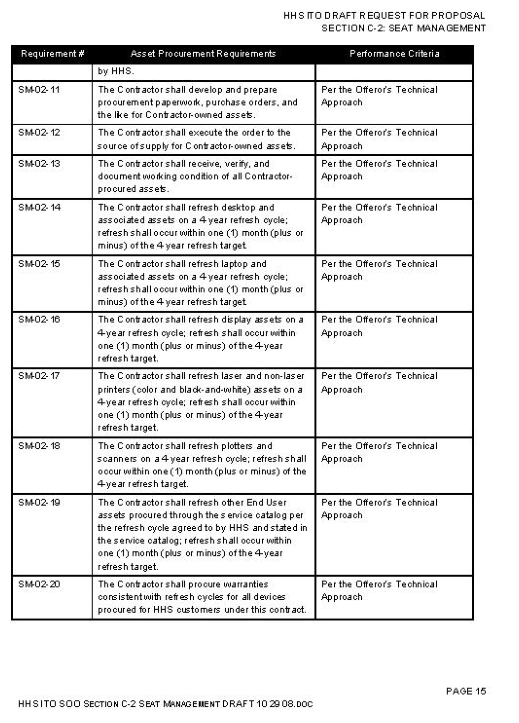

In [ ]:
table = cv2.imread(str(sources_path / "table.jpg"), 0)
show_gray(table, size=(5, 10))

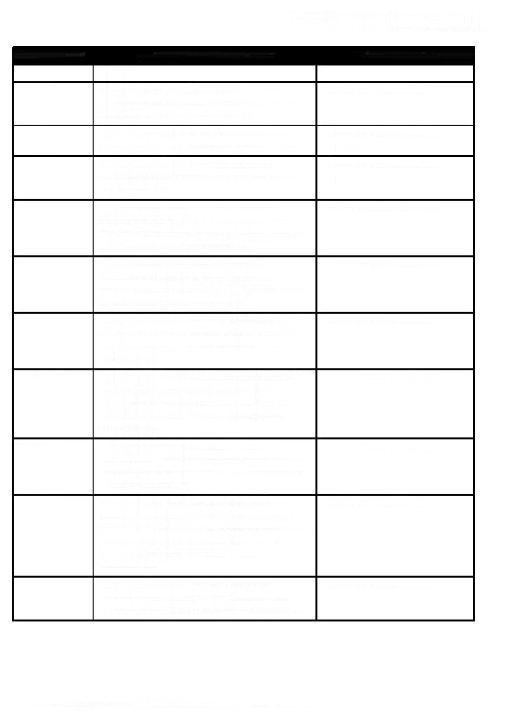

In [ ]:
table_top=cv2.morphologyEx(table, cv2.MORPH_OPEN, kernel=np.ones((2,2),np.uint8)) #deleting white text

table_hor=cv2.morphologyEx(table_top, cv2.MORPH_CLOSE, kernel=np.ones((1,50),np.uint8))

table_vert=cv2.morphologyEx(table_top, cv2.MORPH_CLOSE, kernel = np.ones((50,1),np.uint8))

res=(table_vert&table_hor)|table_top
show_gray(res, size=(5, 10))

**2. (5 баллов)** Для изображения $circles.jpg$ реализуйте морфологический алгоритм для построения трех изображений, которые бы содержали соответственно:

* только частицы, касающиеся краев изображения,

* только группы перекрывающихся частиц,

* только одиночные круглые частицы.

Посчитайте число частиц и групп на каждом изображении. Раскрастье отдельные компоненты с помощью функции.

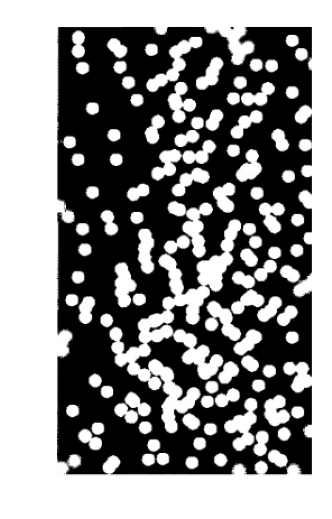

In [ ]:
circles = cv2.imread(str(sources_path / "circles.png"), 0)
show_gray(circles)

### Частицы, касающиеся краев изображения

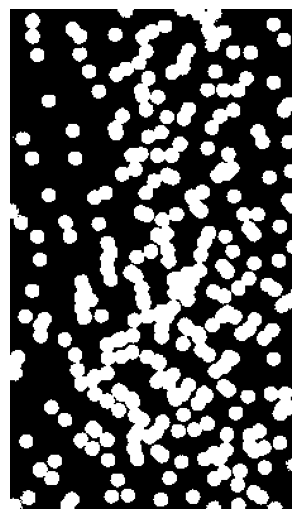

In [ ]:
_, thresh = cv2.threshold(circles, 127, 255, cv2.THRESH_BINARY)
h,w=thresh.shape
borders=np.where(thresh<255)
up_x, down_x=borders[0][0], borders[0][-1]
left_y, right_y=borders[1][0], borders[1][-1]
circles_no_borders=thresh[up_x:down_x, left_y:right_y]
show_gray(circles_no_borders) # image without white borders

Number of touching particles:  17


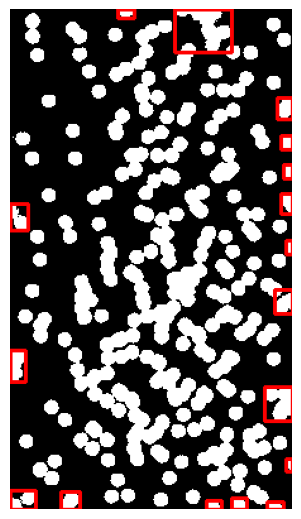

In [ ]:
image=np.copy(circles_no_borders)
contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
height, width = image.shape
img=cv2.merge([image,image,image])
count_touch=0
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    if x == 0 or y == 0 or x + w == width or y + h == height:
        count_touch+=1
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)
show_bgr(img)
print("Number of touching particles: ",count_touch)

### Выделение одиночных

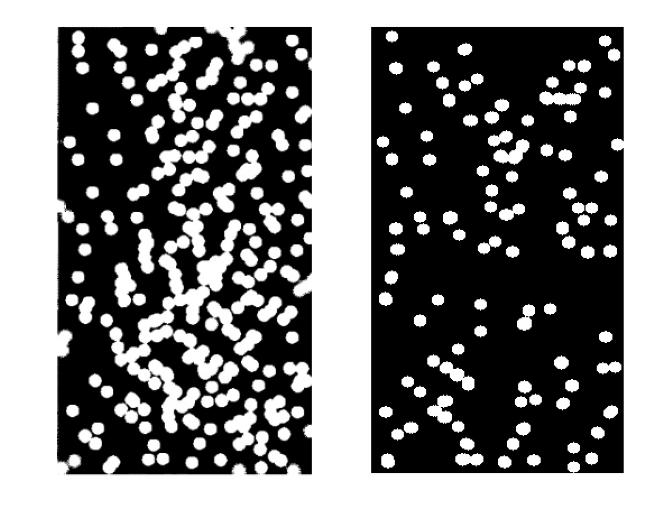

In [ ]:
kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
def hit_or_miss(img, kernel):
    dop_kernel=1-kernel
    dop_kernel=np.pad(dop_kernel, 1, mode='constant', constant_values=1)
    dop_img=cv2.bitwise_not(img)
    a=cv2.erode(img,kernel,iterations = 1)
    b=cv2.erode(dop_img,dop_kernel,iterations = 1)
    result=cv2.bitwise_and(a,b)
    return result

find=hit_or_miss(circles, kernel)
find=cv2.dilate(find,kernel,iterations = 1)
_,result = cv2.threshold(find,0,255,cv2.THRESH_BINARY)
#a=np.where(circles<255)
#print(a)
result[:up_x,:], result[down_x:,:], result[:,:left_y], result[:,right_y:]=255,255,255,255
singles=result[up_x:down_x, left_y:right_y]
show_gray(np.hstack([circles,result]))

### Группы перекрывающихся частиц

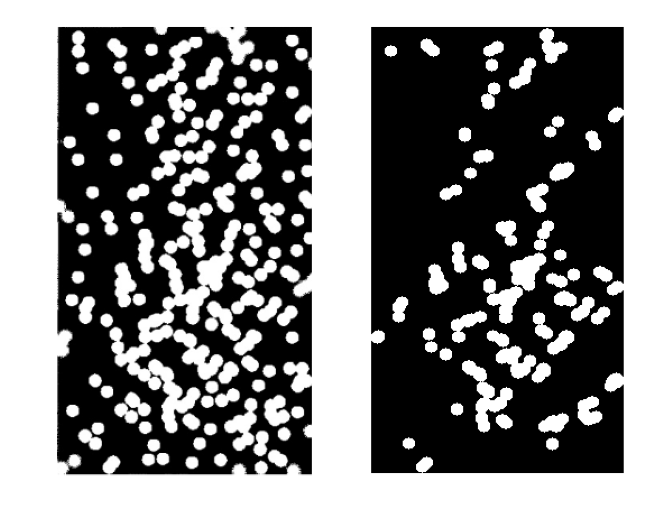

In [ ]:
#old
diff=cv2.absdiff(result, thresh)
#show_gray(diff)
overlapings=cv2.morphologyEx(diff, cv2.MORPH_OPEN, kernel)
overlapings[:up_x,:], overlapings[down_x:,:], overlapings[:,:left_y], overlapings[:,right_y:]=255,255,255,255
show_gray(np.hstack([circles,overlapings]))

51


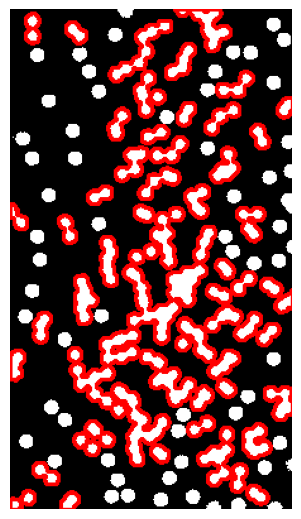

In [ ]:
_, thresh = cv2.threshold(circles, 127, 255, cv2.THRESH_BINARY)

result = cv2.merge([circles_no_borders, circles_no_borders, circles_no_borders])
single_area = 130

count = 0
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

for cont in contours:
    area = cv2.contourArea(cont)
    blob_area = math.ceil(area / single_area)
    if blob_area > 1:
        count += 1
        cv2.drawContours(result, [cont], -1, (0, 0, 255), 2)

print(count)
show_bgr(result)

**3. (5 баллов)** **Watershed**

* Возьмите изображения: *coins_1.jpg*, *coins_noize_1.jpg*
* Примените к ним алгоритм водораздела, чтобы посчитать монетки
* отсоритруйте монетки по размеру и у каждой моентки в центре впишите порядковое число

В сниппете кода содержится подсказка о том, какие функции стоит поприменять.

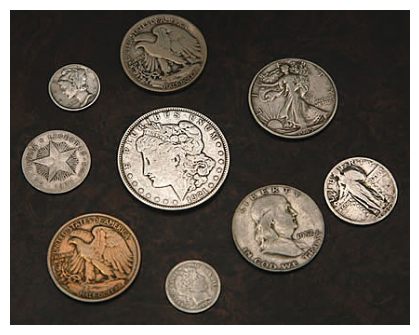

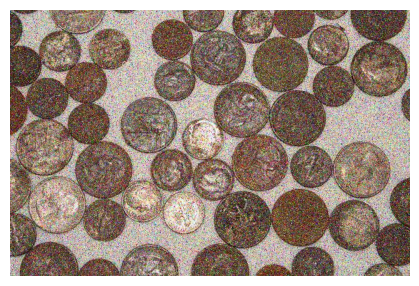

In [ ]:
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import scipy
from scipy.ndimage import distance_transform_edt
from scipy.ndimage import label
from cv2 import pyrMeanShiftFiltering
import copy
coins_1 = cv2.imread(str(sources_path / "coins_1.jpg"))
show_bgr(coins_1, size=(4, 5))
coins_2 = cv2.imread(str(sources_path / "coins_noize_1.jpg"))
show_bgr(coins_2, size=(4, 5))

In [ ]:
from scipy import ndimage
def count_labels(input_img,thresh):
    output_img=copy.copy(input_img)
    D = distance_transform_edt(thresh)

    centroids=peak_local_max(D, min_distance=20, labels=thresh)
    local_max = np.full(thresh.shape, False)
    for coord in centroids:
        local_max[tuple(coord)] = True

    markers,count = ndimage.label(local_max, structure=np.ones((3, 3)))
    watershed_image = watershed(-D, markers, mask=thresh)
    labels=np.unique(watershed_image)[1:]
    print("{} coins found".format(count))

    centroids=[]
    for label in labels:
        region = (watershed_image == label).astype(np.uint8)
        m = cv2.moments(region)
        cx = int(m['m10'] / m['m00'])
        cy = int(m['m01'] / m['m00'])
        centroids.append((cx, cy))

    sorted_regions=sorted(zip(labels,centroids), key=lambda x: cv2.countNonZero((watershed_image == x[0]).astype(np.uint8)))

    for i, (label, centre) in enumerate(sorted_regions):
        cv2.putText(output_img, "{}".format(i+1), (centre[0]-7, centre[1]+5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    return output_img


9 coins found


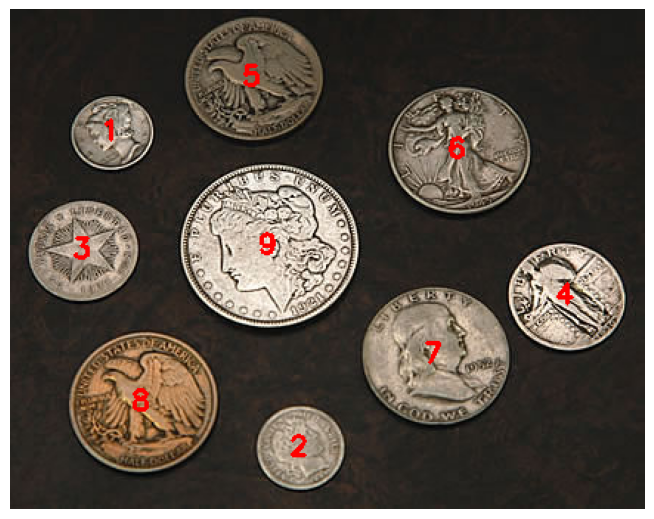

In [ ]:
image = copy.copy(coins_1)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,70,255,cv2.THRESH_BINARY)

kernel = np.ones((3,3),np.uint8)
thresh = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)

show_bgr(count_labels(coins_1,thresh))

In [ ]:
def count_labels_2(input_img,thresh,hough_par,draw_circles=False): ### разница в том, что здесь для сортировки находится радиус через HougCircles
    output_img=copy.copy(input_img)
    D = distance_transform_edt(thresh)

    centroids=peak_local_max(D, min_distance=20, labels=thresh)
    local_max = np.full(thresh.shape, False)
    for coord in centroids:
        local_max[tuple(coord)] = True

    markers,count = ndimage.label(local_max, structure=np.ones((3, 3)))
    watershed_image = watershed(-D, markers, mask=thresh)
    labels=np.unique(watershed_image)[1:]

    centroids=[]
    rois=[]
    for label in labels:
        region = (watershed_image == label).astype(np.uint8)
        m = cv2.moments(region)
        cx = int(m['m10'] / m['m00'])
        cy = int(m['m01'] / m['m00'])
        x, y, w, h = cv2.boundingRect(region)
        rois.append((x, y, w, h))
        centroids.append((cx, cy))
    radii = []
    minD,par1,par2,minR,maxR=hough_par
    for roi in rois:
        x, y, w, h = roi
        subimg = thresh[y:y+h, x:x+w]
        #show_gray(subimg)
        circles = cv2.HoughCircles(subimg, cv2.HOUGH_GRADIENT, dp=1, minDist=minD, param1=par1, param2=par2, minRadius=minR, maxRadius=maxR)
        if circles is None:
            radii.append(-1)
            continue
        radius = int(np.round(circles[0][0][2]))
        radii.append(radius)

    sorted_regions=sorted(zip(labels,centroids, radii), key=lambda x: x[2])

    k=0
    for i, (label, centre, rad) in enumerate(sorted_regions):
        if rad<minR:
            k+=1
            continue
        cv2.putText(output_img, "{}".format(i+1-k), (centre[0]-7, centre[1]+5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        if draw_circles:
            cv2.circle(output_img, centre, rad, (0, 255, 0), 1)
    print("{} coins found".format(count-k))
    return output_img

9 coins found


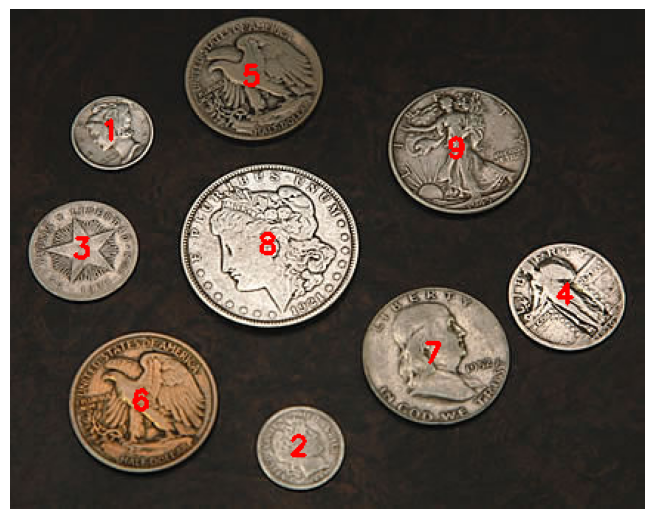

In [ ]:
image = copy.copy(coins_1)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,70,255,cv2.THRESH_BINARY)

kernel = np.ones((3,3),np.uint8)
thresh = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)

show_bgr(count_labels_2(coins_1,thresh,(1, 1, 1, 0, 0)))

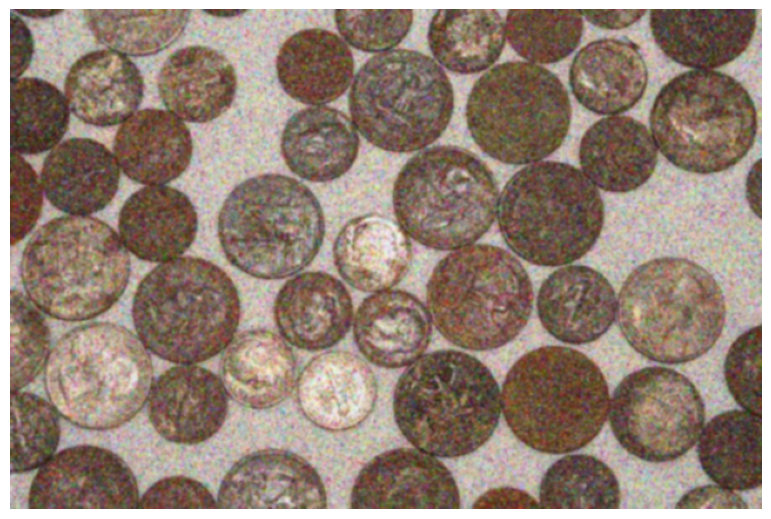

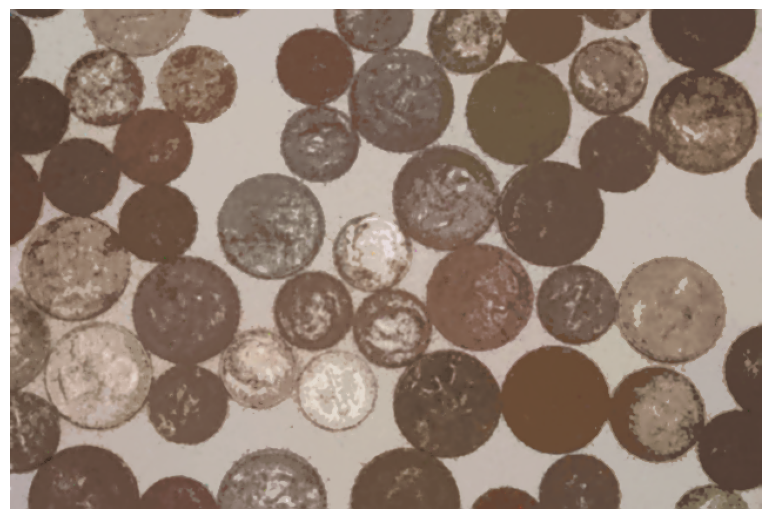

In [ ]:
blur = cv2.GaussianBlur(coins_2, (5, 5), 0)
show_bgr(blur)
shifted = cv2.pyrMeanShiftFiltering(blur, 40, 21)
show_bgr(shifted)
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)

In [ ]:
_,thresh_otsu = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
#show_gray(thresh_otsu)

thresh_ada = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
#show_gray(thresh_ada)

_,thresh = cv2.threshold(gray,150,255,cv2.THRESH_BINARY_INV)
#show_gray(thresh)

kernel = np.ones((3,3),np.uint8)
#kernel=cv2.getStructuringElement(cv2.MORPH_CROSS,(3,3))
thresh_morph = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)
#show_gray(thresh_morph)

37 coins found
44 coins found


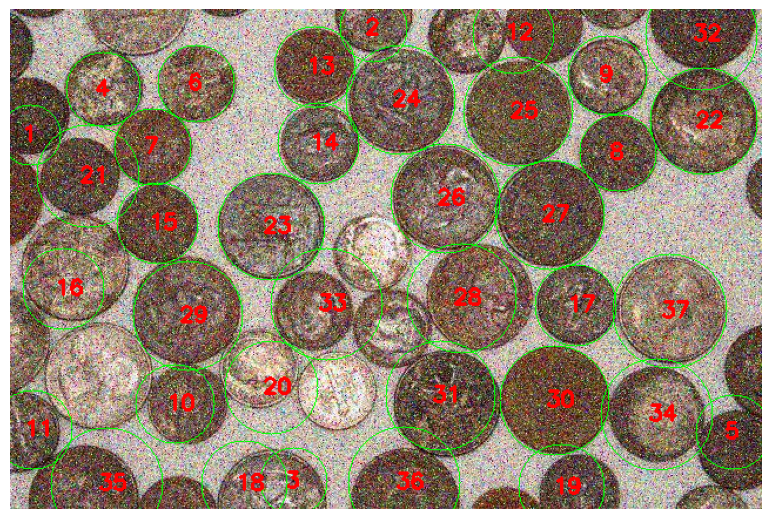

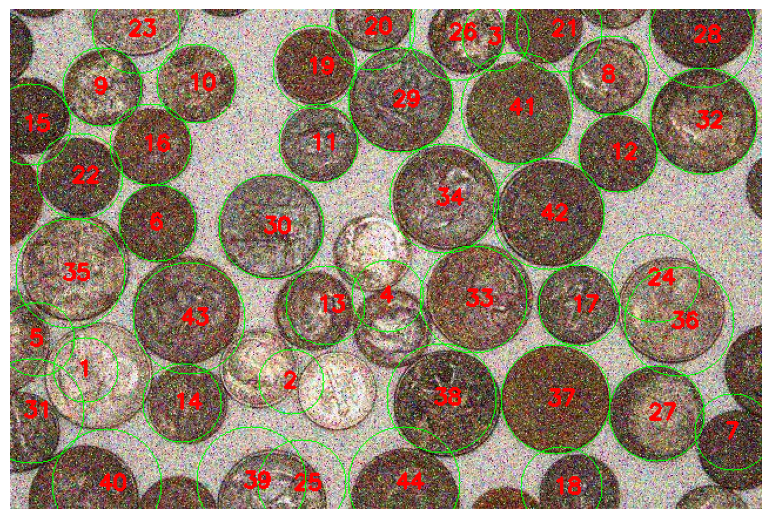

In [ ]:
kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
thresh_morph_circle=cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)
#show_gray(thresh_morph_circle)
show_bgr(count_labels_2(coins_2,thresh_morph_circle,(1, 5, 5, 25, 50),draw_circles=True))
show_bgr(count_labels_2(coins_2,thresh_morph,(1, 1, 1, 25, 50),draw_circles=True))

68 coins found


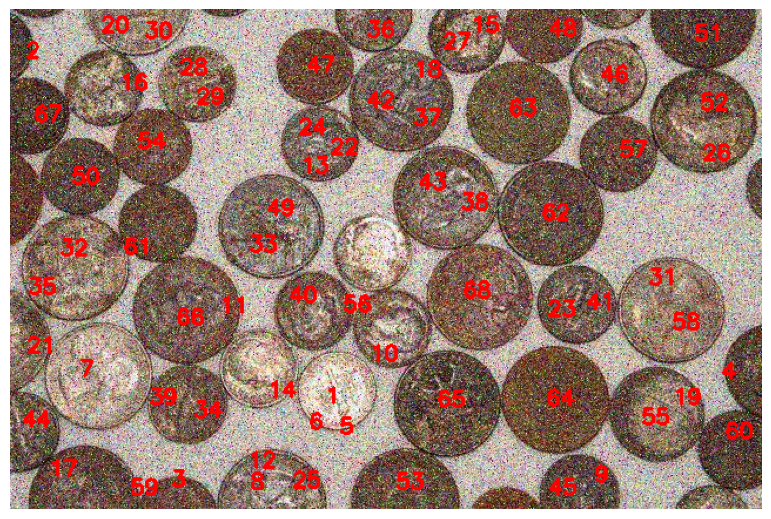

In [ ]:
show_bgr(count_labels(coins_2,thresh))

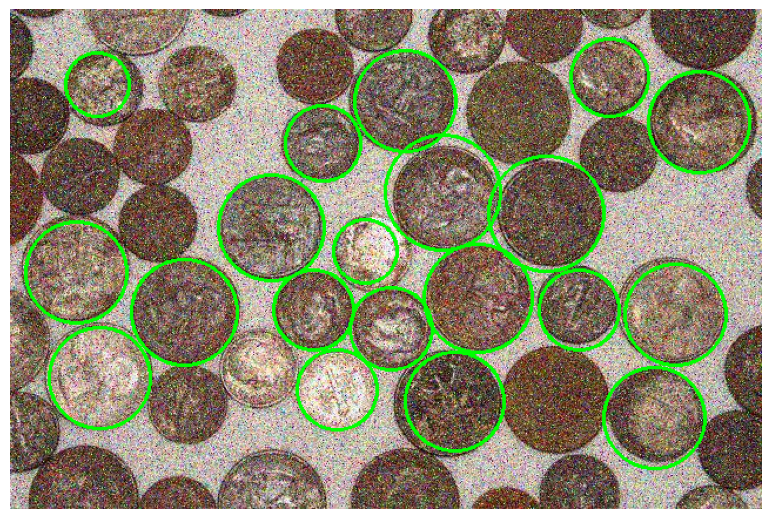

In [ ]:
circles=cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,  # type of detection
        1,  # inverse ratio of accumulator res. to image res.
        50,  # minimum distance between the centers of circles
        param1=10,  # Gradient value passed to edge detection 35
        param2=35,  # accumulator threshold for the circle centers 25
        minRadius=25,  # min circle radius
        maxRadius=50,  # max circle radius
    )

circles=np.uint16(np.around(circles))
coins_out=copy.copy(coins_2)
for i in circles[0,:]:
    cv2.circle(coins_out,(i[0],i[1]),i[2],(0,255,0),2)

show_bgr(coins_out)

# Фильтры габора

**4. (15 баллов)**  

Реализуйте функцию, которая построит банк фильтров Габора по входящим аргументам n, m.
* n – число различных частот в дипазоне (0; max_freq]
* m - число различных напралений в диапазоне [0; Pi)

Продемонструйте, что предложенные фильтры более-менее плотно заполняют частотное просранство. Для этого переведите все фильтры в частотное пространство и отобразите все их одновременно на одной картинке.

Реализуйте интерактивное demo в котром будут два слайдера, один отвечает за разные разные частоы, другой за разные направления. Выведите 3 изображения:
* Вид фильтра в пространстве изображений
* Вид Фильтра в частотном пространстве
* Результат применения фильтра к $lena.jpg$

In [10]:
def gabor(ksize,sigma, theta, lambd, psi, gamma):
    sigma_x = sigma
    sigma_y = float(sigma) / gamma

    nstds = 3
    xmax = max(
        abs(nstds * sigma_x * np.cos(theta)), abs(nstds * sigma_y * np.sin(theta))
    )
    xmax = np.ceil(max(1, xmax))
    ymax = max(
        abs(nstds * sigma_x * np.sin(theta)), abs(nstds * sigma_y * np.cos(theta))
    )
    ymax = np.ceil(max(1, ymax))
    xmax=(ksize-1)//2
    ymax=(ksize-1)//2
    xmin = -xmax
    ymin = -ymax
    (y, x) = np.meshgrid(np.arange(ymin, ymax + 1), np.arange(xmin, xmax + 1))

    x_theta = x * np.cos(theta) + y * np.sin(theta)
    y_theta = -x * np.sin(theta) + y * np.cos(theta)

    gb = np.exp(
        -0.5 * (x_theta**2 / sigma_x**2 + y_theta**2 / sigma_y**2)
    ) * np.cos(2 * np.pi / lambd * x_theta + psi)
    return gb

In [ ]:
def create_gaborfilter(n, m, max_freq=0.7):
    filters = []
    ksize = 27
    sigma = 3.0
    gamma = 0.5
    psi = 0

    for freq in np.arange(max_freq/n, max_freq+max_freq/n, max_freq/n):
        lambd=1/freq
        for theta in np.arange(0, np.pi, np.pi / m):
            kern = gabor(ksize,sigma, theta, lambd, 0,gamma)
            kern /= 1.0 * kern.sum()
            filters.append(kern)

    return filters

In [ ]:
def apply_filter(img, filters):
    newimage = np.zeros_like(img)
    for kern in filters:
        image_filter = cv2.filter2D(img, -1, kern)
        np.maximum(newimage, image_filter, newimage)
    return newimage

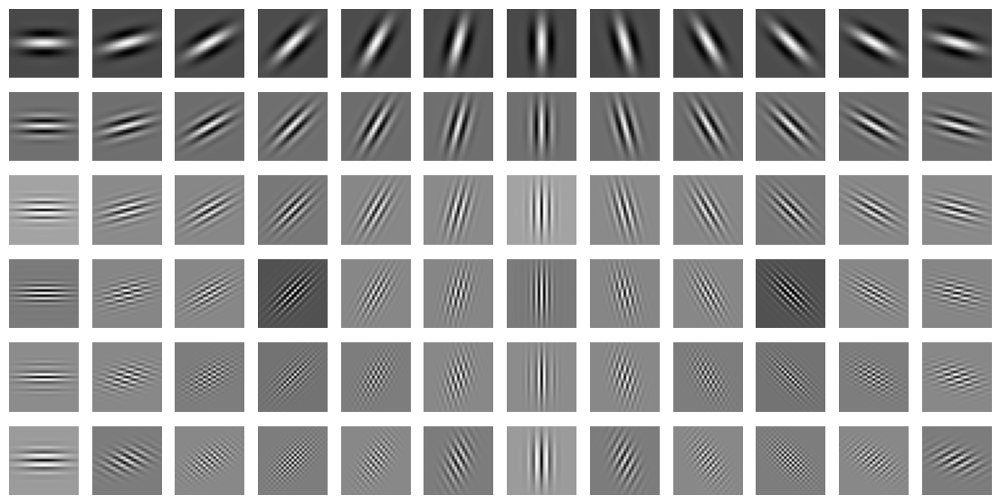

In [ ]:
n=6
m=12
filters=create_gaborfilter(n,m)
size=7
fig, ax = plt.subplots(n, m, figsize=(size * 2, size))
for i in range(n):
    for j in range(m):
        ax[i][j].set_axis_off()
        ax[i][j].imshow(filters[i*m+j], cmap='gray')

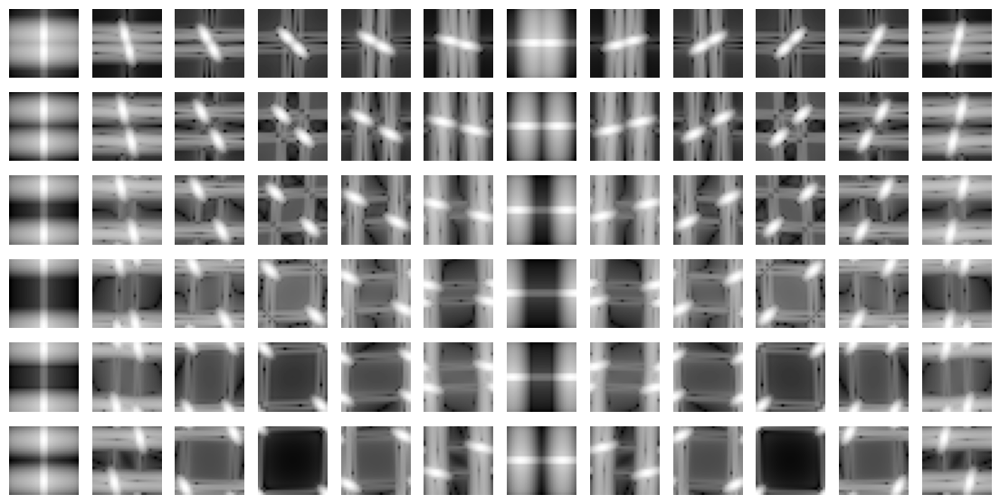

In [ ]:
fig, ax = plt.subplots(n, m, figsize=(size * 2, size))
all_together=np.log(abs(np.fft.fftshift(np.fft.fft2(filters[0]))))
for i in range(n):
    for j in range(m):
        filter_fft= np.fft.fftshift(np.fft.fft2(filters[i*m+j]))
        ax[i][j].set_axis_off()
        ax[i][j].imshow(np.log(abs(filter_fft)), cmap='gray')
        all_together=cv2.add(all_together,np.log(abs(filter_fft)))


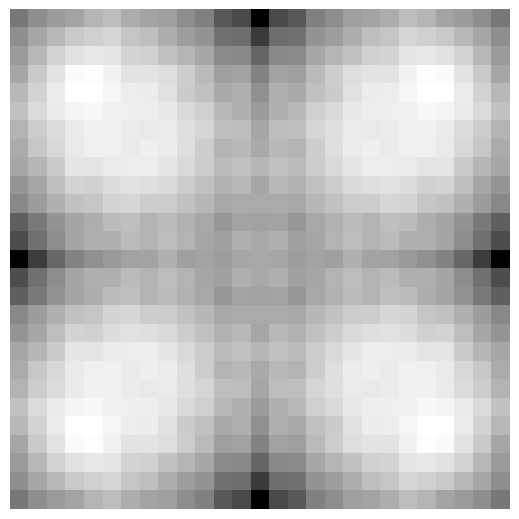

In [ ]:
show_gray(all_together)

In [7]:
def gabor_filter(freq, theta):
    ksize = 35
    sigma = 3.0
    gamma = 0.5
    psi = 0

    lambd=1/freq
    filter= gabor(ksize,sigma, theta, lambd, 0,gamma)
    filter /= 1.0 * filter.sum()

    return filter

In [3]:
lena=cv2.imread(str(sources_path / "lena.jpg"))
#lena = cv2.imread("lena.png")

In [4]:
def lena_widget(freq, theta):
    kern=gabor_filter(freq, theta)
    lena_gabor= cv2.filter2D(lena, -1, kern)

    size=5
    fig, ax = plt.subplots(1, 4, figsize=(size * 4, size))

    kern_fft = np.fft.fftshift(np.fft.fft2(kern))

    ax[0].set_axis_off()
    ax[0].imshow(kern, cmap='gray')
    ax[1].set_axis_off()
    ax[1].imshow(np.log(abs(kern_fft)), cmap='gray')
    ax[2].set_axis_off()
    ax[2].imshow(cv2.cvtColor(lena_gabor, cv2.COLOR_BGR2RGB))
    ax[3].set_axis_off()
    ax[3].imshow(cv2.cvtColor(lena_gabor-lena, cv2.COLOR_BGR2RGB))
    plt.show()


In [5]:
from ipywidgets import interact, widgets, fixed

In [11]:
interact(lena_widget, freq=widgets.FloatSlider(min=0.01, max=0.25, step=0.01, value=0.13),
        theta=widgets.FloatSlider(min=0, max=np.pi,step=np.pi/32, value=np.pi/2), size=fixed(5))

interactive(children=(FloatSlider(value=0.13, description='freq', max=0.25, min=0.01, step=0.01), FloatSlider(…

<function __main__.lena_widget(freq, theta)>

# Гистограмма градиентов

**6. (10 баллов)**

Реализуйте функцию вычисления $HOG$ дескриптора для изображения, которая принимает на вход размер сетки. Визуализируйте полученный дескриптор на изображении *susi_example.jpg* с сетками размером 10x8 и 5x4. Просканируйте скользящим окном изображение *susi_gallery.jpg* и подсветите все области, дексриптор которых поход на дескриптор *susi_example.jpg*. В идеальном случае мы должны получить 3 изображения, для которых надо подобрать порог похожести:
* Та самая вырезанная сушина.
* Все суши с креветкой.
* Все суши, которые визуально похожи на суши с креветкой.

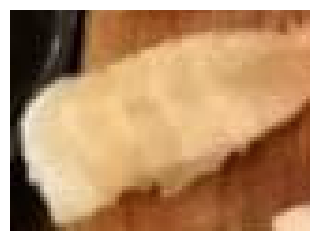

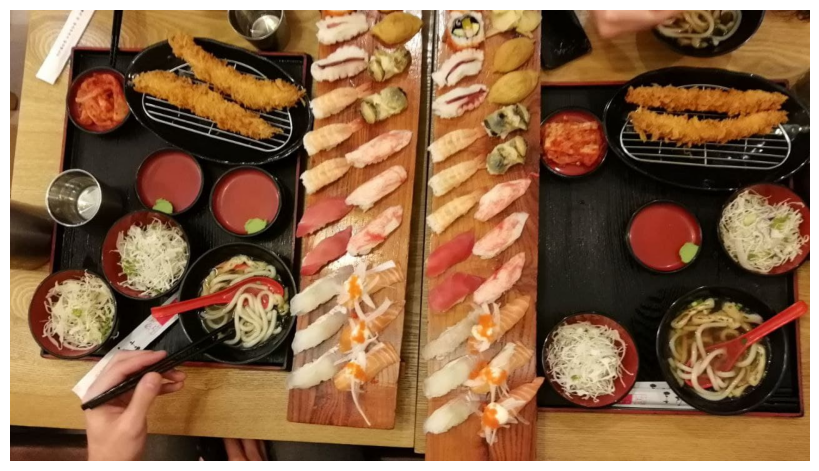

In [ ]:
susi_example = cv2.imread(str(sources_path / "susi_example.jpg"))
show_bgr(susi_example, size=(3, 4))
susi_gallery = cv2.imread(str(sources_path / "susi_gallery.jpg"))
show_bgr(susi_gallery, size=(8, 16))

In [ ]:
h,w,_=susi_example.shape

In [ ]:
def sobel(img):
    f_x = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    f_y = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    G_x = cv2.filter2D(img,-1,f_x)
    G_y = cv2.filter2D(img,-1,f_y)
    return G_x, G_y

In [ ]:
G_x,G_y=sobel(img)

In [ ]:
mag=np.sqrt(np.power(G_x, 2) + np.power(G_y, 2))
angle= np.divide(G_y, G_x, out=np.zeros_like(G_y, dtype=float), where=(G_x!=0))
dir=np.arctan(angle)

In [ ]:
from skimage.feature import hog

In [ ]:
def hog_descriptor(img,size=(5,4)):
    fd, hog_image = hog(img, orientations=9, pixels_per_cell=size, cells_per_block=(3,3),visualize=True, channel_axis=2)
    return hog_image

In [ ]:
hog_susi=hog_descriptor(susi_example, size=(5,4))

In [ ]:
from skimage import feature

img1 = susi_example
img2 = susi_gallery

hog1 = feature.hog(img1, orientations=9, pixels_per_cell=(8,8), cells_per_block=(1,1),visualize=True, channel_axis=2)[1]
hog2 = feature.hog(img2, orientations=9, pixels_per_cell=(8,8), cells_per_block=(1,1),visualize=True, channel_axis=2)[1]

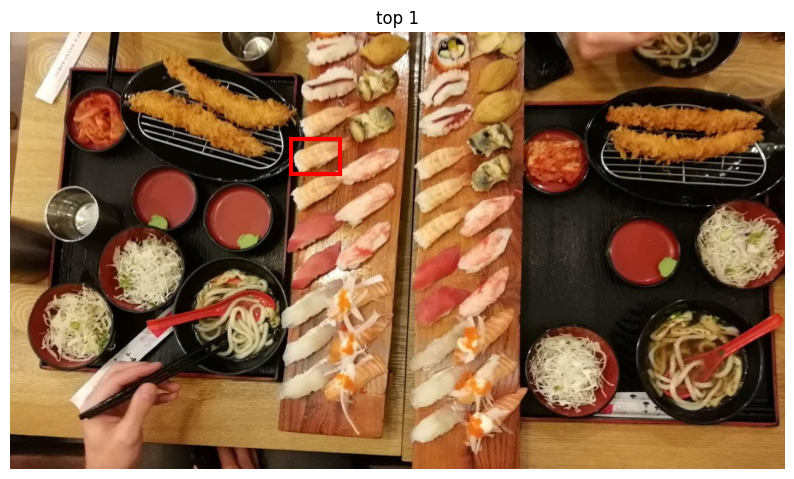

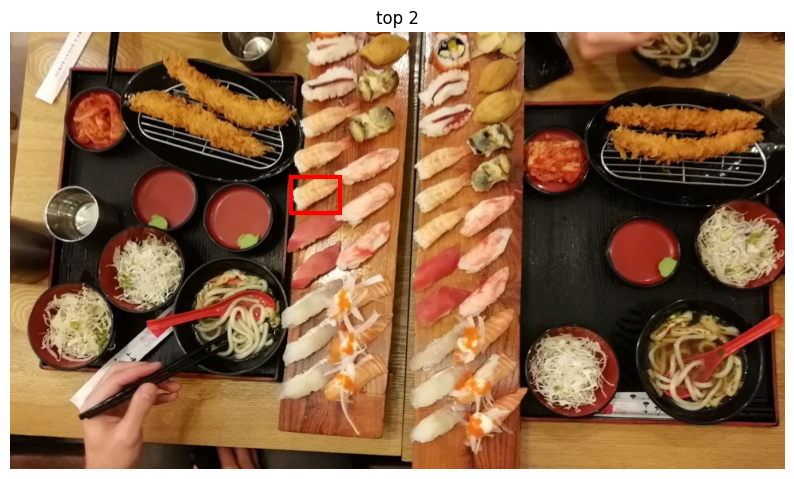

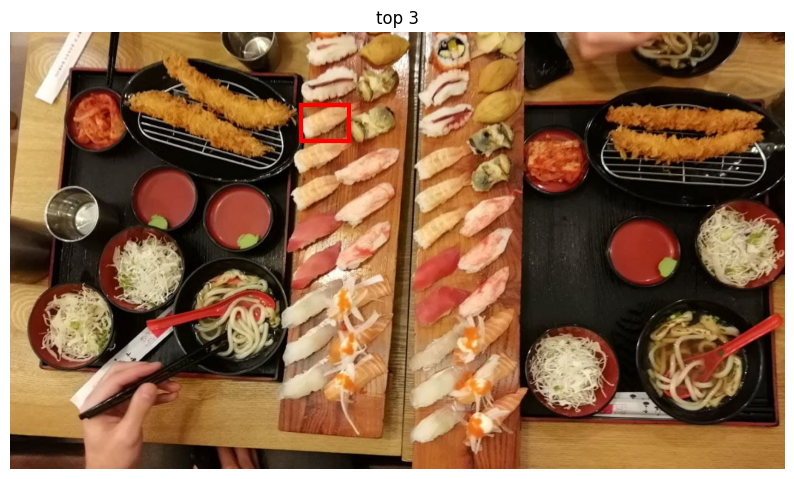

In [ ]:
result = feature.match_template(hog2, hog1)

for i in range(3):
    ij = np.unravel_index(np.argmax(result), result.shape)
    x, y = ij[::-1]

    fig = plt.figure(figsize=(10, 8))
    ax1 = plt.subplot(1, 1, 1)

    ax1.imshow(cv2.cvtColor(susi_gallery, cv2.COLOR_BGR2RGB))
    ax1.set_axis_off()
    ax1.set_title(f'top {i+1}')

    hfind, wfind = hog1.shape
    rect = plt.Rectangle((x, y), wfind, hfind, edgecolor='r', linewidth=3,facecolor='none')
    ax1.add_patch(rect)
    plt.show()
    result[y,x]=0